<h1> PV Solar Power Plant: </h1>

</center><img src="https://www.researchgate.net/publication/342730855/figure/fig3/AS:910476217180160@1594085854156/Solar-radiation-intensity-during-the-three-typical-days.ppm" alt="Solar Panel" width="80%">
</center>


**Example**
> If sunlight is received at an irradiance of 1000W/m2 for 2 hours, 600W/m2 for 1.5 hours and 200W/m2 for 1 hour, the total radiation received that day is 3.1PSH:

> 1000W/m2 × 2 hours + 600W/m2 × 1.5 hours + 200W/m2 × 1 hour = 3100W/m2/day

> 3100W/m2/day ÷ 1000W/m2/day = 3.1PSH

<span style="background-color:skyblue;
             color:white;
             font-size:17px;
             text-align:center;
             border-radius:30px 80px;
             font-weight:bold;
             border:2px solid red;
             padding:0px 20px;">1. Importing Libraries
</span>

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
%matplotlib inline 

import warnings
warnings.filterwarnings("ignore")

<span style="background-color:skyblue;
             color:white;
             font-size:17px;
             text-align:center;
             border-radius:30px 80px;
             font-weight:bold;
             border:2px solid red;
             padding:0px 20px;">2. Importing Power Generation & Weather Sensor Data
</span>

In [3]:
generation_data = pd.read_csv('/Users/tanmaymahindrakar/Documents/Solar_Data/Plant_2_Generation_Data.csv')

In [4]:
weather_data = pd.read_csv('/Users/tanmaymahindrakar/Documents/Solar_Data/Plant_2_Weather_Sensor_Data.csv')

In [5]:
generation_data.sample(5).style.set_properties(
    **{
        'background-color': 'OliveDrab',
        'color': 'white',
    })

,DATE_TIME,PLANT_ID,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD
12948,2020-05-21 13:45:00,4136001,9kRcWv60rDACzjR,1141.106667,1114.100000,6059.000000,2247767160.000000
101,2020-05-15 01:00:00,4136001,WcxssY2VbP4hApt,0.000000,0.000000,0.000000,181695261.000000
16365,2020-05-23 13:00:00,4136001,xoJJ8DcxJEcupym,1237.500000,1206.553333,5698.933333,209183037.933333
39449,2020-06-04 14:45:00,4136001,xoJJ8DcxJEcupym,571.853333,560.426667,5012.466667,209258178.466667
64052,2020-06-16 06:30:00,4136001,LlT2YUhhzqhg5Sw,71.207143,69.007143,18.214286,282779505.214286


In [6]:
weather_data.sample(5).style.set_properties(
    **{
        'background-color': 'pink',
        'color': 'Black',
    })

,DATE_TIME,PLANT_ID,SOURCE_KEY,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
2554,2020-06-10 15:45:00,4136001,iq8k7ZNt4Mwm3w0,28.852435,27.612677,0.175676
1787,2020-06-02 15:45:00,4136001,iq8k7ZNt4Mwm3w0,31.931493,43.152596,0.335381
2997,2020-06-15 06:30:00,4136001,iq8k7ZNt4Mwm3w0,24.604525,25.129300,0.061841
1469,2020-05-30 08:00:00,4136001,iq8k7ZNt4Mwm3w0,27.117775,30.895562,0.266990
819,2020-05-23 13:15:00,4136001,iq8k7ZNt4Mwm3w0,36.292765,57.502195,0.863084


<span style="background-color:skyblue;
             color:white;
             font-size:17px;
             text-align:center;
             border-radius:30px 80px;
             font-weight:bold;
             border:2px solid red;
             padding:0px 20px;">3. Adjust datetime format
</span>

In [7]:
generation_data['DATE_TIME'] = pd.to_datetime(generation_data['DATE_TIME'],format = '%Y-%m-%d %H:%M')

weather_data['DATE_TIME'] = pd.to_datetime(weather_data['DATE_TIME'],format = '%Y-%m-%d %H:%M:%S')

<span style="background-color:skyblue;
             color:white;
             font-size:17px;
             text-align:center;
             border-radius:30px 80px;
             font-weight:bold;
             border:2px solid red;
             padding:0px 20px;">4. Merging generation data and weather sensor data  
</span>

In [8]:
df_solar = pd.merge(generation_data.drop(columns = ['PLANT_ID']), weather_data.drop(columns = ['PLANT_ID', 'SOURCE_KEY']), on='DATE_TIME')

df_solar.sample(5).style.background_gradient(cmap='coolwarm')

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
7379,2020-05-18 12:00:00,PeE6FRyGXUgsRhN,1210.640000,1180.533333,2284.066667,1348372138.066667,30.224230,49.631033,0.878656
22799,2020-05-27 06:30:00,PeE6FRyGXUgsRhN,81.007143,78.585714,22.214286,1348428733.214286,25.858954,25.846911,0.056535
11949,2020-05-20 23:45:00,WcxssY2VbP4hApt,0.000000,0.000000,5688.000000,181744220.000000,25.513830,23.451961,0.000000
32564,2020-06-01 08:15:00,4UPUqMRk7TRMgml,323.766667,317.993333,350.333333,2552909.333333,25.838382,29.698360,0.217574
26621,2020-05-29 11:30:00,oZZkBaNadn6DNKz,1027.780000,1004.793333,3414.066667,1708183034.066667,31.960417,49.445566,0.748482


<span style="background-color:skyblue;
             color:white;
             font-size:17px;
             text-align:center;
             border-radius:30px 80px;
             font-weight:bold;
             border:2px solid red;
             padding:0px 20px;">5. Adding separate time and date columns  
</span>

In [9]:
# adding separate time and date columns
df_solar["DATE"] = pd.to_datetime(df_solar["DATE_TIME"]).dt.date
df_solar["TIME"] = pd.to_datetime(df_solar["DATE_TIME"]).dt.time
df_solar['DAY'] = pd.to_datetime(df_solar['DATE_TIME']).dt.day
df_solar['MONTH'] = pd.to_datetime(df_solar['DATE_TIME']).dt.month
df_solar['WEEK'] = pd.to_datetime(df_solar['DATE_TIME']).dt.week


# add hours and minutes for ml models
df_solar['HOURS'] = pd.to_datetime(df_solar['TIME'],format='%H:%M:%S').dt.hour
df_solar['MINUTES'] = pd.to_datetime(df_solar['TIME'],format='%H:%M:%S').dt.minute
df_solar['TOTAL MINUTES PASS'] = df_solar['MINUTES'] + df_solar['HOURS']*60

# add date as string column
df_solar["DATE_STRING"] = df_solar["DATE"].astype(str) # add column with date as string
df_solar["HOURS"] = df_solar["HOURS"].astype(str)
df_solar["TIME"] = df_solar["TIME"].astype(str)

df_solar.head(2)

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,DATE,TIME,DAY,MONTH,WEEK,HOURS,MINUTES,TOTAL MINUTES PASS,DATE_STRING
0,2020-05-15,4UPUqMRk7TRMgml,0.0,0.0,9425.0,2.429011e+06,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15
1,2020-05-15,81aHJ1q11NBPMrL,0.0,0.0,0.0,1.215279e+09,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15


In [10]:
df_solar.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 67698 entries, 0 to 67697
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   DATE_TIME            67698 non-null  datetime64[ns]
 1   SOURCE_KEY           67698 non-null  object        
 2   DC_POWER             67698 non-null  float64       
 3   AC_POWER             67698 non-null  float64       
 4   DAILY_YIELD          67698 non-null  float64       
 5   TOTAL_YIELD          67698 non-null  float64       
 6   AMBIENT_TEMPERATURE  67698 non-null  float64       
 7   MODULE_TEMPERATURE   67698 non-null  float64       
 8   IRRADIATION          67698 non-null  float64       
 9   DATE                 67698 non-null  object        
 10  TIME                 67698 non-null  object        
 11  DAY                  67698 non-null  int64         
 12  MONTH                67698 non-null  int64         
 13  WEEK                 67698 non-

In [11]:
df_solar.isnull().sum()

DATE_TIME              0
SOURCE_KEY             0
DC_POWER               0
AC_POWER               0
DAILY_YIELD            0
TOTAL_YIELD            0
AMBIENT_TEMPERATURE    0
MODULE_TEMPERATURE     0
IRRADIATION            0
DATE                   0
TIME                   0
DAY                    0
MONTH                  0
WEEK                   0
HOURS                  0
MINUTES                0
TOTAL MINUTES PASS     0
DATE_STRING            0
dtype: int64

<h3> There is no Missing Values in the dataset </h3>

In [12]:
df_solar.describe().style.background_gradient(cmap='coolwarm')

,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,DAY,MONTH,WEEK,MINUTES,TOTAL MINUTES PASS
count,67698.000000,67698.000000,67698.000000,67698.000000,67698.000000,67698.000000,67698.000000,67698.000000,67698.000000,67698.000000,67698.000000,67698.000000
mean,246.701961,241.277825,3294.890295,658944788.423766,27.986756,32.607233,0.229204,15.530680,5.529705,22.563296,22.517061,714.329522
std,370.569597,362.112118,2919.448386,729667771.073241,4.021294,11.226446,0.309365,8.527546,0.499120,1.474730,16.764084,415.672274
min,0.000000,0.000000,0.000000,0.000000,20.942385,20.265123,0.000000,1.000000,5.000000,20.000000,0.000000,0.000000
25%,0.000000,0.000000,272.750000,19964944.866667,24.570349,23.685627,0.000000,9.000000,5.000000,21.000000,15.000000,360.000000
50%,0.000000,0.000000,2911.000000,282627587.000000,26.910352,27.433723,0.018554,16.000000,6.000000,23.000000,30.000000,720.000000
75%,446.591667,438.215000,5534.000000,1348495113.000000,30.912601,40.019036,0.431027,22.000000,6.000000,24.000000,45.000000,1080.000000
max,1420.933333,1385.420000,9873.000000,2247916295.000000,39.181638,66.635953,1.098766,31.000000,6.000000,25.000000,45.000000,1425.000000


<span style="background-color:skyblue;
             color:white;
             font-size:17px;
             text-align:center;
             border-radius:30px 80px;
             font-weight:bold;
             border:2px solid red;
             padding:0px 20px;">6. Converting 'SOURCE_KEY' from categorical form to numerical form
</span>

In [13]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
df_solar['SOURCE_KEY_NUMBER'] = encoder.fit_transform(df_solar['SOURCE_KEY'])
df_solar.head()

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,DATE,TIME,DAY,MONTH,WEEK,HOURS,MINUTES,TOTAL MINUTES PASS,DATE_STRING,SOURCE_KEY_NUMBER
0,2020-05-15,4UPUqMRk7TRMgml,0.0,0.0,9425.000000,2.429011e+06,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,0
1,2020-05-15,81aHJ1q11NBPMrL,0.0,0.0,0.000000,1.215279e+09,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,1
2,2020-05-15,9kRcWv60rDACzjR,0.0,0.0,3075.333333,2.247720e+09,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,2
3,2020-05-15,Et9kgGMDl729KT4,0.0,0.0,269.933333,1.704250e+06,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,3
4,2020-05-15,IQ2d7wF4YD8zU1Q,0.0,0.0,3177.000000,1.994153e+07,27.004764,25.060789,0.0,2020-05-15,00:00:00,15,5,20,0,0,0,2020-05-15,4


<h1 style="text-align: justify; font-family: 'Lucida Calligraphy'; font-size:35px; color:#e90045">Data Visualization: </h1>

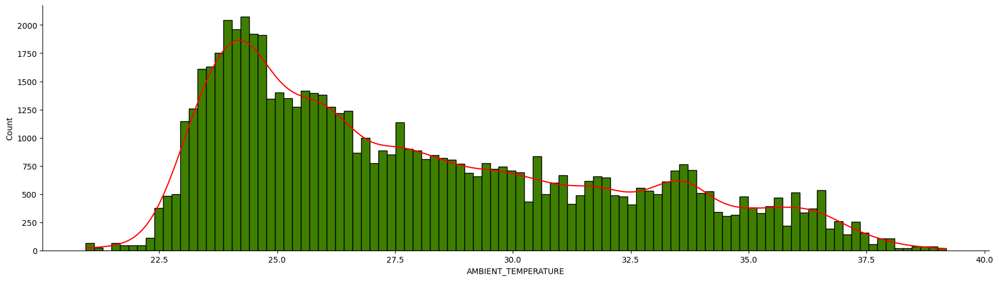

In [14]:
sns.displot(data=df_solar, x="AMBIENT_TEMPERATURE", kde=True, bins = 100,color = "red", facecolor = "#3F7F00",height = 5, aspect = 3.5);

In [15]:
df_solar['DATE'].nunique()

34

The data of solar power generation is of 34 days 

<h1>Faults & Abnormalities detection in solar power plant generation </h1>

<span style="background-color:skyblue;
             color:white;
             font-size:17px;
             text-align:center;
             border-radius:30px 80px;
             font-weight:bold;
             border:2px solid red;
             padding:0px 20px;">7. Multiple Plotting of DC_POWER generation on per day basis.
</span>

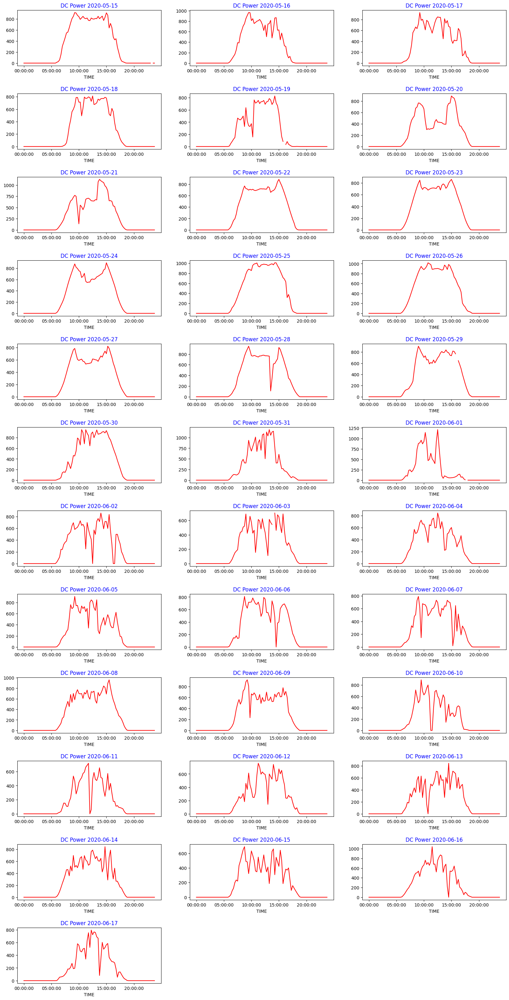

In [16]:
solar_dc = df_solar.pivot_table(values='DC_POWER', index='TIME', columns='DATE')

def Daywise_plot(data= None, row = None, col = None, title='DC Power'):
    cols = data.columns # take all column
    gp = plt.figure(figsize=(20,40)) 
    
    gp.subplots_adjust(wspace=0.2, hspace=0.5)
    for i in range(1, len(cols)+1):
        ax = gp.add_subplot(row,col, i)
        data[cols[i-1]].plot(ax=ax, color='red')
        ax.set_title('{} {}'.format(title, cols[i-1]),color='blue')
        
Daywise_plot(data=solar_dc, row=12, col=3)

<span class="label label-default" style="background-color:pink; border-radius:12px; font-weight: bold; font-family:Verdana; font-size:20px; color:Red; ">Ideal Graph of Solar Power Generation 📊📈</span>

<img src="https://www.solarmarket.com.au/wp-content/uploads/2021/04/solar-output-graph.png" alt="Solar Panel" width="50%">
</center>

<blockquote style="margin-right:auto; margin-left:auto; background-color: #FAFAD2; padding: 1em; margin:3px;font-size:20px;font-family:Comic Sans Ms;color:#660000;letter-spacing:0.7px;text-align: justify;">

> The reason we get this shape is based on the angle of the sun to your panels. In the early morning, when the sun is still rising, it’s essentially at its lowest point in the sky. In order for the sunlight to reach your panels at this time of the day, it has to cut through the most amount of atmosphere. This is important to note, because energy from the sun is absorbed when it travels through the atmosphere. So, this means that the more atmosphere it travels through, the more energy is absorbed and the less that is available for your panels to convert into electricity. At midday, when the sun is directly overhead, sunlight doesn’t need to travel through as much atmosphere. Therefore, your panels will absorb more sunlight during this time.

- In winter, the same concept applies. However, on gloomier winter days there may be less sunlight for your panels to absorb. 
- This can simply be explained by the sun being positioned lower in the sky than it is during summer. 

<span style="background-color:maroon;
             color:white;
             font-size:16px;
             text-align:center;
             border-radius:30px 30px;
             font-weight:bold;
             border:2px solid red;
             padding:5px">Abnormalities in DC_POWER Generation
</span>

<blockquote style="margin-right:auto; margin-left:auto; background-color: #FAFAD2; padding: 1em; margin:3px;font-size:20px;font-family:Comic Sans Ms;color:#660000;letter-spacing:0.7px;text-align: justify;">

**From the per day DC_POWER generation graph we can find that, most of the days there is a some fluctuation in the power generation.**

*Less Fluctuation in DC_POWER generation is observed in these days.*

> 1. 2020-05-15
> 2. 2020-05-18
> 3. 2020-05-22
> 4. 2020-05-23
> 5. 2020-05-24
> 6. 2020-05-25
> 7. 2020-05-26

*High Fluctuation in DC_POWER generation is observed in these days.*

> 1. 2020-05-19
> 2. 2020-05-28
> 3. 2020-05-29
> 4. 2020-06-02
> 5. 2020-06-03
> 6. 2020-06-04
> 7. 2020-06-13
> 8. 2020-06-14
> 9. 2020-06-17

*Very High Fluctuation & Reduction in DC_POWER generation is observed in these days.*

> 1. 2020-06-03
> 2. 2020-06-11
> 3. 2020-06-12
> 4. 2020-06-15

**Note: Reason for very high Fluctuation & Reduction in DC_POWER generation is due to fault in the system or may be fluctuation in weather or due to clouds etc. which need to be analyse further**

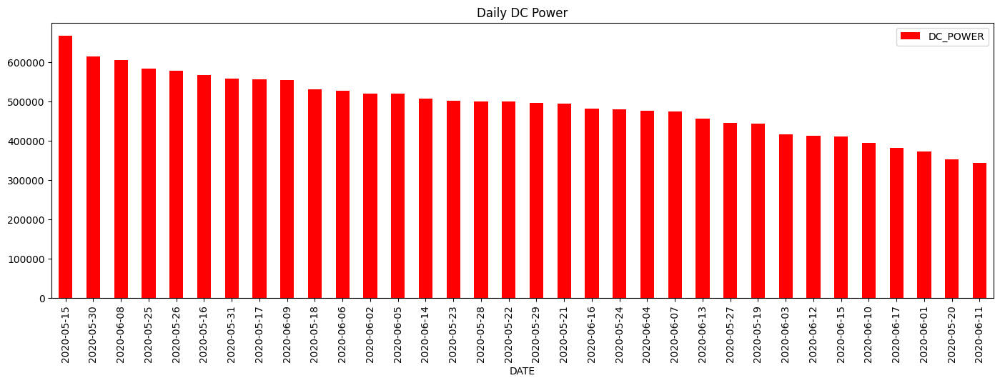

In [17]:
daily_dc = df_solar.groupby('DATE')['DC_POWER'].agg('sum')

ax = daily_dc.sort_values(ascending=False).plot.bar(figsize=(17,5), legend=True,color='red')
plt.title('Daily DC Power')
plt.show()

<blockquote style="margin-right:auto; margin-left:auto; background-color: #FAFAD2; padding: 1em; margin:3px;font-size:20px;font-family:Comic Sans Ms;color:#660000;letter-spacing:0.7px;text-align: justify;">

**From the per day DC_POWER generation graph we can find the average power generation per day.**

> *Highest average DC_POWER Generation is on*: **2020-05-15**

> *Lowest average DC_POWER Generation is on* : **2020-06-11**


<h2>NOTE: This Large variation in the DC_POWER generation is due to the fault in the system or due to weather change, which needs to be studied further. But from this bar plot we find the day on which there is highest DC_POWER generated and the day with the lowest DC_POWER generated.</h2>
 

<span style="background-color:skyblue;
             color:white;
             font-size:17px;
             text-align:center;
             border-radius:30px 80px;
             font-weight:bold;
             border:2px solid red;
             padding:0px 20px;">8. Multiple Plotting of IRRADIATION generation on per day basis.
</span>

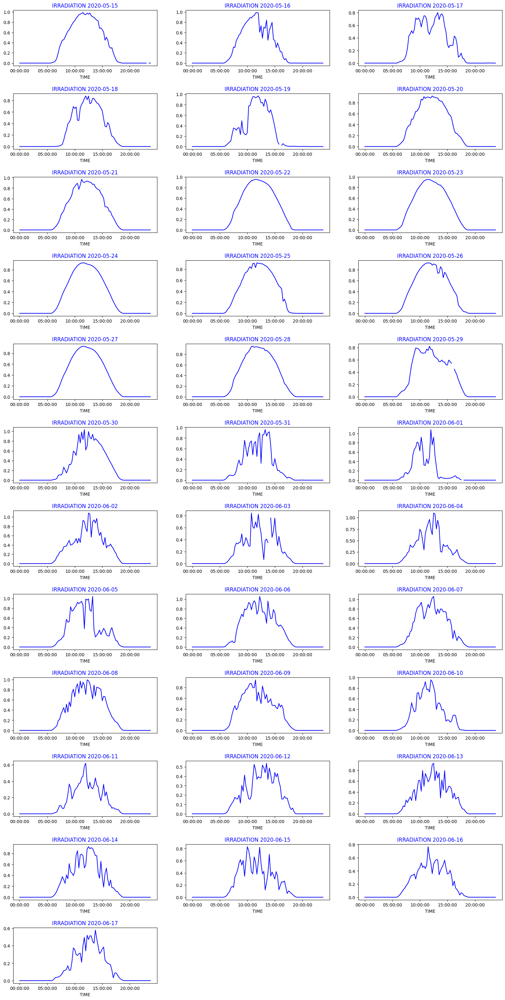

In [18]:
solar_irradiation = df_solar.pivot_table(values='IRRADIATION', index='TIME', columns='DATE')

def Daywise_plot(data= None, row = None, col = None, title='IRRADIATION'):
    cols = data.columns # take all column
    gp = plt.figure(figsize=(20,40)) 
    
    gp.subplots_adjust(wspace=0.2, hspace=0.5)
    for i in range(1, len(cols)+1):
        ax = gp.add_subplot(row,col, i)
        data[cols[i-1]].plot(ax=ax, color='blue')
        ax.set_title('{} {}'.format(title, cols[i-1]),color='blue')
        
Daywise_plot(data=solar_irradiation, row=12, col=3)

<blockquote style="margin-right:auto; margin-left:auto; background-color: #FAFAD2; padding: 1em; margin:3px;font-size:20px;font-family:Comic Sans Ms;color:#660000;letter-spacing:0.7px;text-align: justify;">

**IRRADIATION graph pattern is looking very similar to the corresponding DC_POWER generation on per day basis.** 

- In solar power plant DC_POWER or Output power is mostly depends on IRRADIATION . It is not wrong to say that it’s directly proportional.

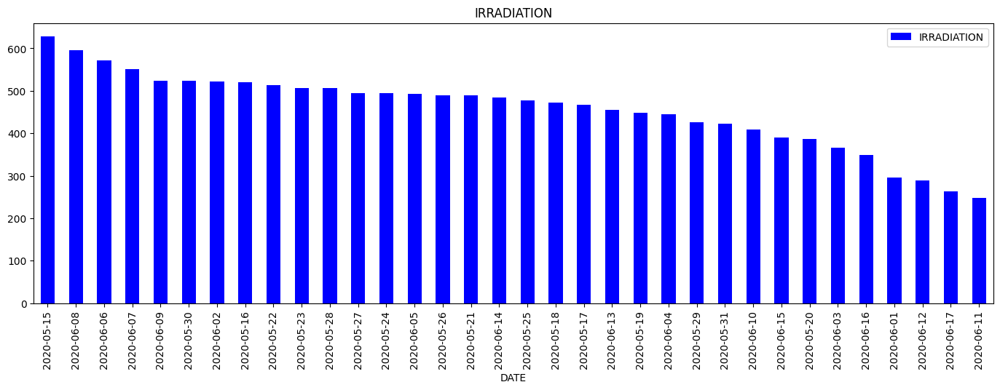

In [19]:
daily_irradiation = df_solar.groupby('DATE')['IRRADIATION'].agg('sum')

daily_irradiation.sort_values(ascending=False).plot.bar(figsize=(17,5), legend=True,color='blue')
plt.title('IRRADIATION')
plt.show()

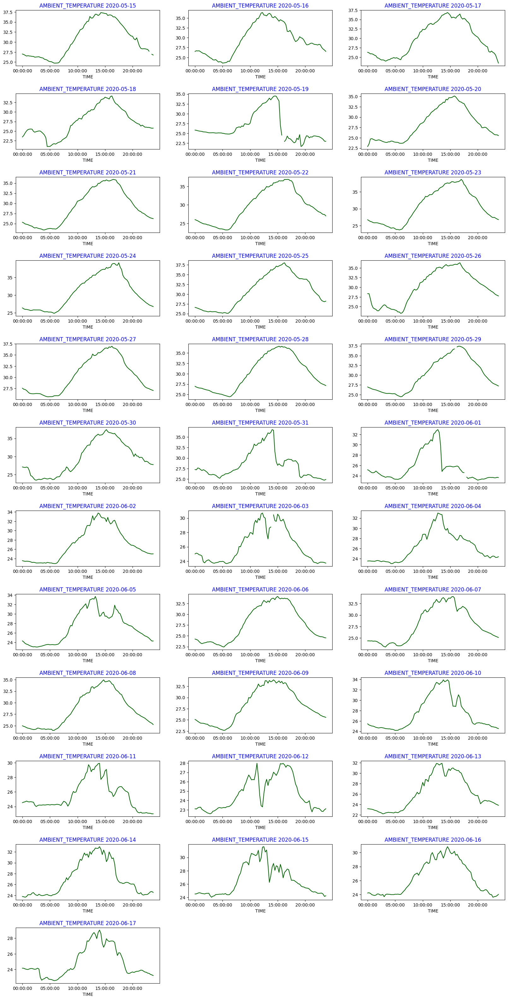

In [20]:
solar_ambiant_temp = df_solar.pivot_table(values='AMBIENT_TEMPERATURE', index='TIME', columns='DATE')

def Daywise_plot(data= None, row = None, col = None, title='AMBIENT_TEMPERATURE'):
    cols = data.columns # take all column
    gp = plt.figure(figsize=(20,40)) 
    
    gp.subplots_adjust(wspace=0.2, hspace=0.5)
    for i in range(1, len(cols)+1):
        ax = gp.add_subplot(row,col, i)
        data[cols[i-1]].plot(ax=ax, color='darkgreen')
        ax.set_title('{} {}'.format(title, cols[i-1]),color='blue')
        
Daywise_plot(data=solar_ambiant_temp, row=12, col=3)

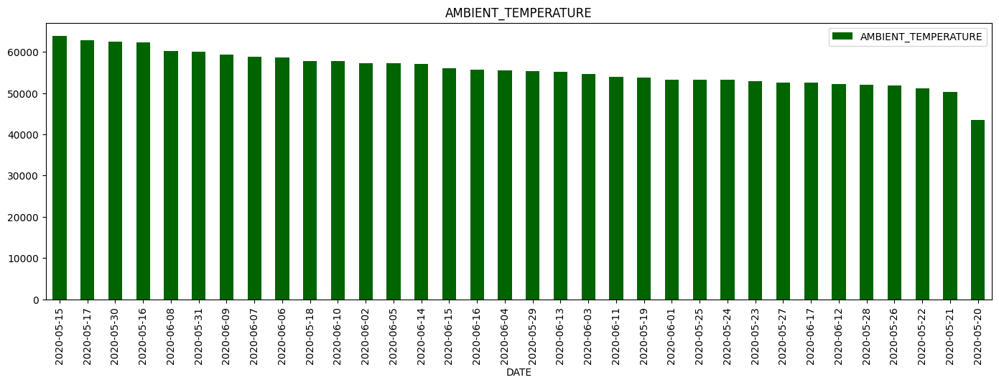

In [21]:
daily_ambient_temp = df_solar.groupby('DATE')['AMBIENT_TEMPERATURE'].agg('sum')

daily_ambient_temp.sort_values(ascending=False).plot.bar(figsize=(17,5), legend=True,color='darkgreen')
plt.title('AMBIENT_TEMPERATURE')
plt.show()

<h1>Best and Worst Power generation comparision: </h1>

<span class="label label-default" style="background-color:pink; border-radius:12px; font-weight: bold; font-family:Verdana; font-size:20px; color:Red; ">Major Environmental Factors affecting the of solar power generation are.</span>

<blockquote style="margin-right:auto; margin-left:auto; background-color: #FAFAD2; padding: 1em; margin:3px;font-size:20px;font-family:Comic Sans Ms;color:#660000;letter-spacing:0.7px;text-align: justify;">

> 1. The thickness of clouds is also a factor in how much sunlight your solar panels can soak up. We may see thicker clouds in winter too and this is something else to look out for. It’s hard for sunlight to travel through thick clouds, which will affect your solar power system’s output. 
> 2. While we’ve looked at the sun’s positioning and how it can affect output, there’s another factor to consider when your system may not be performing at its maximum… even at midday.
> 3. Solar panel temperature is the number one reason behind your solar power system not achieving peak performance
> 4. Solar power generation is directly dependant on Irradiation comming from the sun.

<span style="background-color:skyblue;
             color:white;
             font-size:17px;
             text-align:center;
             border-radius:30px 80px;
             font-weight:bold;
             border:2px solid red;
             padding:0px 20px;">9. Highest average DC_POWER is generated on "2020-05-15"  
</span>

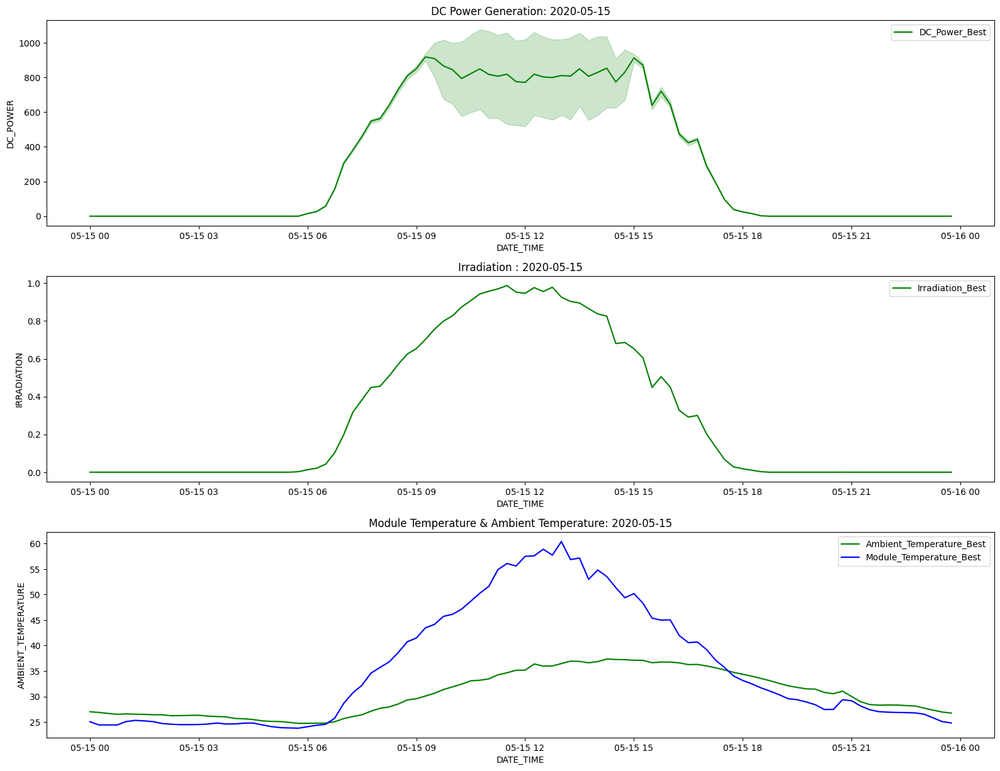

In [22]:
date = ["2020-05-15"]
plt.figure(figsize=(16,16))
# Subplot 1: DC Power Generation
plt.subplot(411)
sns.lineplot(data=df_solar[df_solar["DATE_STRING"].isin(date)], x="DATE_TIME", y="DC_POWER", label="DC_Power_Best", color='green')
plt.title("DC Power Generation: {}".format(date[0]))

# Subplot 2: Irradiation
plt.subplot(412)
sns.lineplot(data=df_solar[df_solar["DATE_STRING"].isin(date)], x="DATE_TIME", y="IRRADIATION", label="Irradiation_Best", color='green')
plt.title("Irradiation : {}".format(date[0]))

# Subplot 3: Ambient and Module Temperature
plt.subplot(413)
sns.lineplot(data=df_solar[df_solar["DATE_STRING"].isin(date)], x="DATE_TIME", y="AMBIENT_TEMPERATURE", label="Ambient_Temperature_Best", color='green')
sns.lineplot(data=df_solar[df_solar["DATE_STRING"].isin(date)], x="DATE_TIME", y="MODULE_TEMPERATURE", label="Module_Temperature_Best", color='blue')
plt.title("Module Temperature & Ambient Temperature: {}".format(date[0]))

plt.tight_layout()
plt.show()


<h2>NOTE: Both DC_POWER graph and IRRADIATION graph is almost looking like an ideal graph which is explained earlier. Weather is also looking good, and there are no clouds in the sky because there is very less variation in IRRADIATION and temperature of the solar panel and ambient temperature.</h2>


<span style="background-color:skyblue;
             color:white;
             font-size:17px;
             text-align:center;
             border-radius:30px 80px;
             font-weight:bold;
             border:2px solid red;
             padding:0px 20px;">10. Lowest average DC_POWER is generated on "2020-06-11"  
</span>

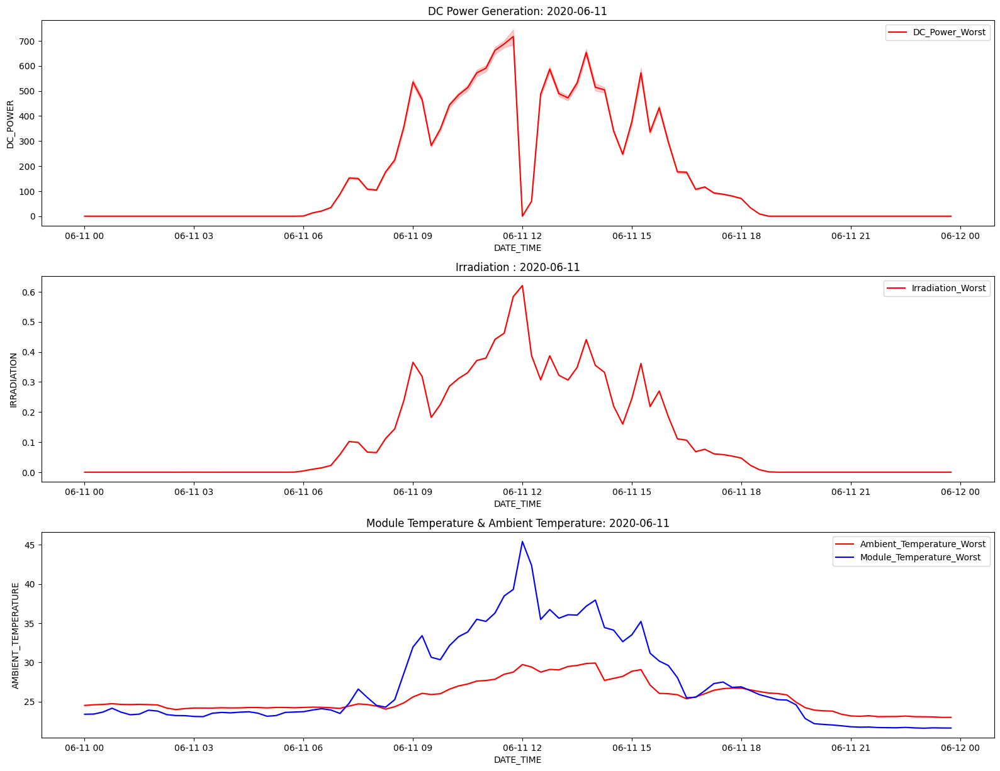

In [23]:
date = ["2020-06-11"]
plt.figure(figsize=(16,16))

# Subplot 1: DC Power Generation
plt.subplot(411)
sns.lineplot(data=df_solar[df_solar["DATE_STRING"].isin(date)], x="DATE_TIME", y="DC_POWER", label="DC_Power_Worst", color='red')
plt.title("DC Power Generation: {}".format(date[0]))

# Subplot 2: Irradiation
plt.subplot(412)
sns.lineplot(data=df_solar[df_solar["DATE_STRING"].isin(date)], x="DATE_TIME", y="IRRADIATION", label="Irradiation_Worst", color='red')
plt.title("Irradiation : {}".format(date[0]))

# Subplot 3: Ambient and Module Temperature
plt.subplot(413)
sns.lineplot(data=df_solar[df_solar["DATE_STRING"].isin(date)], x="DATE_TIME", y="AMBIENT_TEMPERATURE", label="Ambient_Temperature_Worst", color='red')
sns.lineplot(data=df_solar[df_solar["DATE_STRING"].isin(date)], x="DATE_TIME", y="MODULE_TEMPERATURE", label="Module_Temperature_Worst", color='blue')
plt.title("Module Temperature & Ambient Temperature: {}".format(date[0]))

plt.tight_layout()
plt.show()

<h2>NOTE: There are very large fluctuations in both DC_POWER graph and IRRADIATION graph </h2>


<blockquote style="margin-right:auto; margin-left:auto; background-color: #FAFAD2; padding: 1em; margin:3px;font-size:20px;font-family:Comic Sans Ms;color:#660000;letter-spacing:0.7px;text-align: justify;">

**Possible Reasons for these large fluctuation in the DC_POWER, IRRADIATION, Ambient temperature, Module temperature:**

> At about 12 O’clock there is a sharp decline in the DC_POWER generation from 700 to almost 20 KWatt. 

> And at the same time IRRADIATION fall from 0.6 to 0.3 almost half.

> Ambient temperature and Module temperature also fall drastically. Module temperature from 45 C to 35 C & Ambient temperature is also reduced. 

<code style="background:yellow;color:red">The possible reason for this reduction is due to may be heavy rain and heavily clouded sky and bad weather. There is almost very less possibility of any fault in the system </code>

<h1 >Solar Power Plant Inverter Efficiency Calculation </h1>

In [24]:
solar_dc_power = df_solar[df_solar['DC_POWER'] > 0]['DC_POWER'].values
solar_ac_power = df_solar[df_solar['AC_POWER'] > 0]['AC_POWER'].values

In [25]:
solar_plant_eff = (np.max(solar_ac_power)/np.max(solar_dc_power ))*100
print(f"Power ratio AC/DC (Efficiency) of Solar Power Plant:  {solar_plant_eff:0.3f} %")

Power ratio AC/DC (Efficiency) of Solar Power Plant:  97.501 %


In [26]:
AC_list=[]
for i in df_solar['AC_POWER']:
    if i>0:
        AC_list.append(i)
AC_list
#AC_list.sort()
#AC_list.reverse()
len(AC_list)

32036

In [27]:
#Here we take all nonzero DC values and plot them on histogram
DC_list=[]
for i in df_solar['DC_POWER']:
    if i>0:
        DC_list.append(i)
DC_list
DC_list.sort()
DC_list.reverse()
len(DC_list)

32036

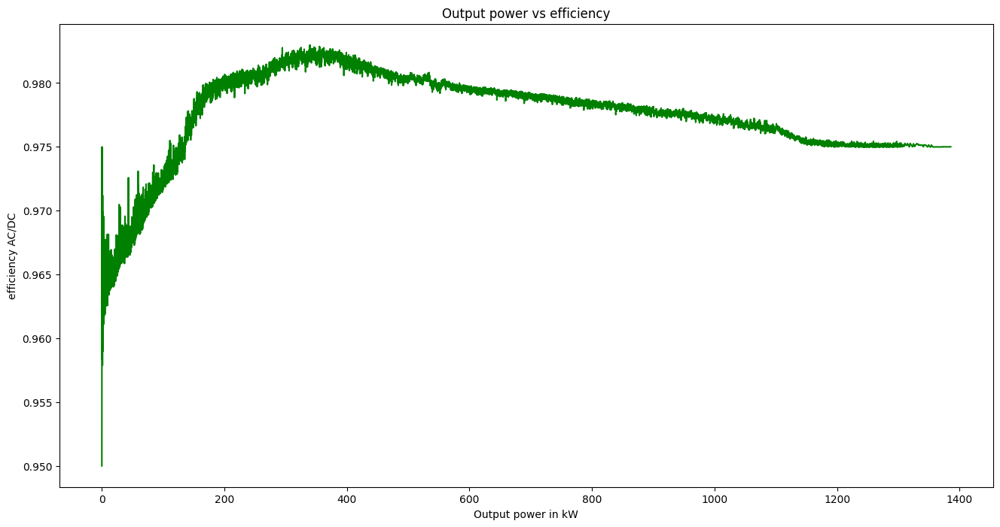

In [28]:
plt.figure(figsize=(16,8))
AC_list.sort()
DC_list.sort()
#print(DC_list)
#DC_list.sort
#res = [i / 10 for i in AC_list]
eff = [i/j for i,j in zip(AC_list,DC_list)]

plt.plot(AC_list,eff,color='green')
plt.xlabel('Output power in kW')
plt.ylabel('efficiency AC/DC')
plt.title('Output power vs efficiency');

<span style="background-color:red;
             color:white;
             font-size:17px;
             text-align:center;
             border-radius:30px 80px;
             font-weight:bold;
             border:2px solid red;
             padding:0px 20px;">11. What does inverter efficiency mean?
</span>

<blockquote style="margin-right:auto; margin-left:auto; background-color: #FAFAD2; padding: 1em; margin:3px;font-size:20px;font-family:Comic Sans Ms;color:#660000;letter-spacing:0.7px;text-align: justify;">

- In fact, we shall discuss here the general power inverter efficiency whether it is a solar inverter or a pure sine wave inverter or even a modified sine wave inverter.

- The inverter efficiency refers to how much dc power will be converted to ac power, as some of power will be lost during this transition in two forms:

*Heat loss.*
- Stand-by power which consumed just to keep the inverter in power mode. Also, we can refer to it as inverter power consumption at no load condition.

- Hence, inverter efficiency = pac/pdc where pac refers to ac output power in watt and pdc refers to dc input power in watts.

<img src="https://www.inverter.com/images/uploaded/inverter-output-power-efficiency-diagram.jpg" alt="Solar Panel" width="90%">
</center>

> For the two basic inverters types in the market, the typical efficiency of high-quality pure sine wave inverter varied from 90% to 95% and for low quality modified sine wave inverter, it varied from 75% to 85%.

> This power inverter efficiency value depends on inverter load power capacity variation, as the efficiency increases and may reach to its max value at higher load power capacity in compare to lower loading power capacity, and in condition that not going above inverter output power capacity limit. Generally, below 15% inverter loading, the efficiency will be quite low. Consequently, good matching between inverter capacity and its load capacity will enable us harvest larger efficiency, which means larger inverter ac output power for the same dc input power.

[REFERENCE: ](https://www.inverter.com/what-is-inverter-efficiency)

<h1>Solar Power Prediction</h1>

In [29]:
df2 = df_solar.copy()
X = df2[['DAILY_YIELD','TOTAL_YIELD','AMBIENT_TEMPERATURE','MODULE_TEMPERATURE','IRRADIATION','DC_POWER']]
y = df2['AC_POWER']

In [30]:
X.head()

,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION,DC_POWER
0,9425.000000,2.429011e+06,27.004764,25.060789,0.0,0.0
1,0.000000,1.215279e+09,27.004764,25.060789,0.0,0.0
2,3075.333333,2.247720e+09,27.004764,25.060789,0.0,0.0
3,269.933333,1.704250e+06,27.004764,25.060789,0.0,0.0
4,3177.000000,1.994153e+07,27.004764,25.060789,0.0,0.0


In [31]:
y.head()

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: AC_POWER, dtype: float64

In [32]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=.2,random_state=21)

<span style="background-color:skyblue;
             color:Black;
             font-size:25px;
             text-align:center;
             border-radius:30px 80px;
             font-weight:bold;
             border:2px solid red;
             padding:0px 20px;">1. LinearRegression
</span>

In [33]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

lr_clf = LinearRegression()
lr_clf.fit(X_train,y_train)
score_lr = 100*lr_clf.score(X_test,y_test)
print(f'LR Model score = {score_lr:4.4f}%')

LR Model score = 99.9994%


In [34]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

lr = LinearRegression()
lr.fit(X_train,y_train)
y_pred_lr = lr.predict(X_test)
R2_Score_lr = round(r2_score(y_pred_lr,y_test) * 100, 2)

print("R2 Score : ",R2_Score_lr,"%")

R2 Score :  100.0 %


<span style="background-color:skyblue;
             color:Black;
             font-size:25px;
             text-align:center;
             border-radius:30px 80px;
             font-weight:bold;
             border:2px solid red;
             padding:0px 20px;">2. RandomForestRegressor
</span>

In [35]:
from sklearn.ensemble import RandomForestRegressor
rfr = RandomForestRegressor()
rfr.fit(X_train,y_train)
y_pred_rfr = rfr.predict(X_test)
R2_Score_rfr = round(r2_score(y_pred_rfr,y_test) * 100, 2)

print("R2 Score : ",R2_Score_rfr,"%")

R2 Score :  100.0 %


<span style="background-color:skyblue;
             color:Black;
             font-size:25px;
             text-align:center;
             border-radius:30px 80px;
             font-weight:bold;
             border:2px solid red;
             padding:0px 20px;">3. DecisionTreeRegressor
</span>

In [36]:
from sklearn.tree import DecisionTreeRegressor
dtr = DecisionTreeRegressor()
dtr.fit(X_train,y_train)

y_pred_dtr = rfr.predict(X_test)
R2_Score_dtr = round(r2_score(y_pred_dtr,y_test) * 100, 2)

print("R2 Score : ",R2_Score_dtr,"%")

R2 Score :  100.0 %


<span style="background-color:skyblue;
             color:Black;
             font-size:25px;
             text-align:center;
             border-radius:30px 80px;
             font-weight:bold;
             border:2px solid red;
             padding:0px 20px;">4. K Neighbors Regressor
</span>

In [39]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score

knn = KNeighborsRegressor(n_neighbors=5)

knn.fit(X_train, y_train)

# Predict using the model
y_pred_knn = knn.predict(X_test)

# Calculate R² score
R2_Score_knn = round(r2_score(y_test, y_pred_knn) * 100, 2)

print("K-Nearest Neighbors Regressor (KNN) R² Score: ", R2_Score_knn, "%")


K-Nearest Neighbors Regressor (KNN) R² Score:  90.77 %


<span style="background-color:skyblue;
             color:Black;
             font-size:25px;
             text-align:center;
             border-radius:30px 80px;
             font-weight:bold;
             border:2px solid red;
             padding:0px 20px;">5. AdaBoost Regressor
</span>

In [40]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import r2_score

abr = AdaBoostRegressor(n_estimators=100, random_state=42)

abr.fit(X_train, y_train)

# Predict using the model
y_pred_abr = abr.predict(X_test)

# Calculate R² score
R2_Score_abr = round(r2_score(y_test, y_pred_abr) * 100, 2)

print("AdaBoost Regressor R² Score: ", R2_Score_abr, "%")


AdaBoost Regressor R² Score:  99.76 %


<span style="background-color:skyblue;
             color:white;
             font-size:17px;
             text-align:center;
             border-radius:30px 80px;
             font-weight:bold;
             border:2px solid red;
             padding:0px 20px;">12. Result Prediction
</span>

In [41]:
prediction = rfr.predict(X_test)
print(prediction)

[   0.            0.          684.71197619 ...    0.         1007.1844
    0.        ]


In [42]:
cross_checking = pd.DataFrame({'Actual' : y_test , 'Predicted' : prediction})
cross_checking.head()

,Actual,Predicted
40426,0.000000,0.000000
50974,0.000000,0.000000
53919,684.913333,684.711976
2384,0.000000,0.000000
22014,0.000000,0.000000


In [43]:
cross_checking['Error'] = cross_checking['Actual'] - cross_checking['Predicted']
cross_checking.head()

,Actual,Predicted,Error
40426,0.000000,0.000000,0.000000
50974,0.000000,0.000000,0.000000
53919,684.913333,684.711976,0.201357
2384,0.000000,0.000000,0.000000
22014,0.000000,0.000000,0.000000


In [44]:
cross_checking_final  = cross_checking[cross_checking['Error'] <= 20]
cross_checking_final.sample(25).style.background_gradient(
        cmap='coolwarm').set_properties(**{
            'font-family': 'Lucida Calligraphy',
            'color': 'LigntGreen',
            'font-size': '15px'
        })

,Actual,Predicted,Error
18716,0.000000,0.000000,0.000000
12559,465.180000,465.098886,0.081114
23672,23.400000,23.364505,0.035495
24761,403.033333,402.976829,0.056505
20535,0.000000,0.000000,0.000000
26281,115.528571,115.532933,-0.004362
38481,0.000000,0.000000,0.000000
29973,0.000000,0.000000,0.000000
41849,38.192857,38.197219,-0.004362
41249,0.000000,0.000000,0.000000


<h1> Exploratory Data Analysis: </h1>

In [45]:
generation_data = pd.read_csv('/Users/tanmaymahindrakar/Documents/Solar_Data/Plant_2_Generation_Data.csv')
weather_data = pd.read_csv('/Users/tanmaymahindrakar/Documents/Solar_Data/Plant_2_Weather_Sensor_Data.csv')

generation_data['DATE_TIME'] = pd.to_datetime(generation_data['DATE_TIME'],format = '%Y-%m-%d %H:%M')
weather_data['DATE_TIME'] = pd.to_datetime(weather_data['DATE_TIME'],format = '%Y-%m-%d %H:%M:%S')
df = pd.merge(generation_data.drop(columns = ['PLANT_ID']), weather_data.drop(columns = ['PLANT_ID', 'SOURCE_KEY']), on='DATE_TIME')
df.head()

,DATE_TIME,SOURCE_KEY,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
0,2020-05-15,4UPUqMRk7TRMgml,0.0,0.0,9425.000000,2.429011e+06,27.004764,25.060789,0.0
1,2020-05-15,81aHJ1q11NBPMrL,0.0,0.0,0.000000,1.215279e+09,27.004764,25.060789,0.0
2,2020-05-15,9kRcWv60rDACzjR,0.0,0.0,3075.333333,2.247720e+09,27.004764,25.060789,0.0
3,2020-05-15,Et9kgGMDl729KT4,0.0,0.0,269.933333,1.704250e+06,27.004764,25.060789,0.0
4,2020-05-15,IQ2d7wF4YD8zU1Q,0.0,0.0,3177.000000,1.994153e+07,27.004764,25.060789,0.0


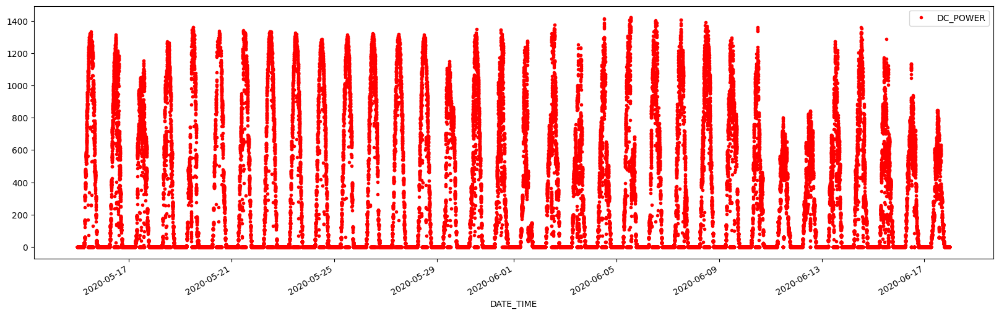

In [46]:
df.plot(x= 'DATE_TIME', y='DC_POWER', style='.', figsize = (20, 6),color= "red");

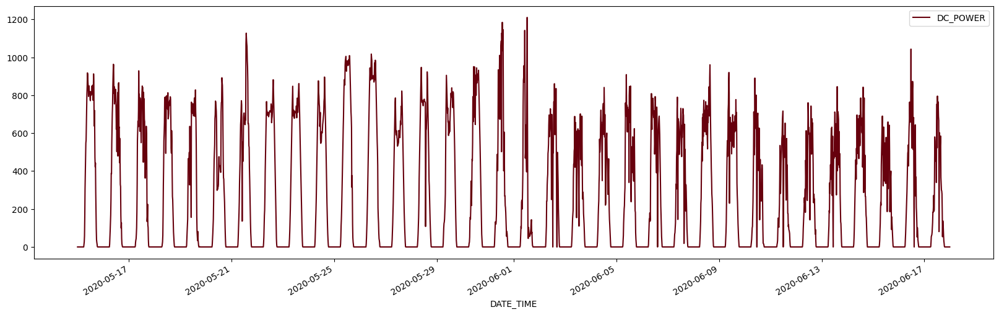

In [47]:
df.groupby('DATE_TIME')['DC_POWER'].agg('mean').plot(legend=True, colormap='Reds_r',figsize = (20, 6));

In [59]:
import plotly.graph_objects as go
import plotly.express as px
from plotly.offline import iplot

data = go.Bar(x = df.groupby('SOURCE_KEY').agg({'TOTAL_YIELD':'mean'}). \
              reset_index()['SOURCE_KEY'],
              y = df.groupby('SOURCE_KEY').agg({'TOTAL_YIELD':'mean'}). \
              reset_index()['TOTAL_YIELD'],
              width=[0.5, 0.5],
              text =round(df.groupby('SOURCE_KEY').agg({'TOTAL_YIELD':'mean'}).reset_index()['TOTAL_YIELD'],2),
              textposition= 'outside',
              textfont = dict(size = 26,
                             color = 'deeppink'),
              marker = dict(color = 'pink',
                            line_color = 'deeppink',
                            line_width = 3,
                            opacity = 0.65))

layout = go.Layout(title = {'text': "Avg TOTAL_YIELD by SOURCE_KEY",
                           'y':1.0,
                           'x':0.5,
                           'xanchor': 'center',
                           'yanchor': 'top'},
                   xaxis = dict(title = 'SOURCE_KEY'),
                   yaxis =dict(title = 'TOTAL_YIELD'),
                   width = 1400,
                   height = 700,
                   template = 'simple_white')

fig=go.Figure(data = data, layout = layout)
iplot(fig)

In [60]:
import plotly.express as px
fig = px.sunburst(df, path=['SOURCE_KEY'], values='DAILY_YIELD',color='MODULE_TEMPERATURE')
fig.update_layout (height = 800 , width = 800)
fig.show()

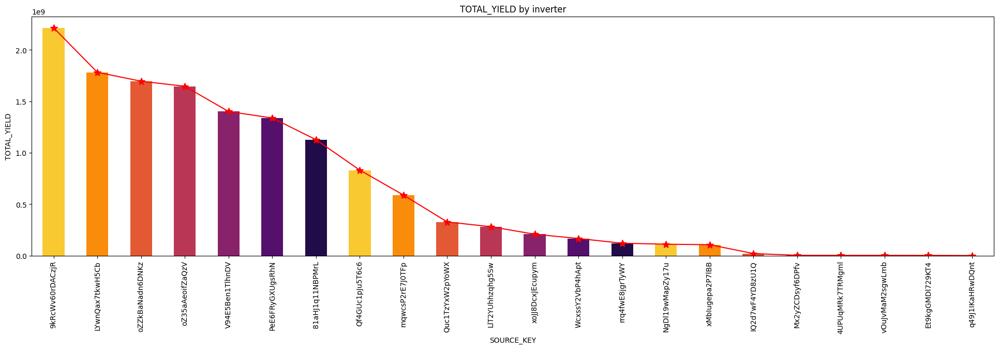

In [61]:
plt.figure(figsize=(24,6))
plt.title('TOTAL_YIELD by inverter')
plt.ylabel('TOTAL_YIELD')
df.groupby('SOURCE_KEY')['TOTAL_YIELD'].mean().sort_values(ascending=False).plot(kind='line', marker='*', color='red', ms=10)
df.groupby('SOURCE_KEY')['TOTAL_YIELD'].mean().sort_values(ascending=False).plot(kind='bar',color=sns.color_palette("inferno_r", 7))
plt.show()

In [62]:
import plotly.graph_objects as go
import plotly.express as px

labels = df['SOURCE_KEY']
values =df['TOTAL_YIELD']
fig = go.Figure(data = [go.Pie(labels = labels , values = values , 
         textinfo = 'label+percent' , hole =0.3, pull = [.1, 0, 0, 0])])
fig.show()

In [63]:
import plotly.express as px
import plotly.graph_objs as go

fig = px.scatter(df, x = 'DAILY_YIELD', y = 'IRRADIATION', log_x=True,
                 hover_name="SOURCE_KEY", hover_data=["DAILY_YIELD", "IRRADIATION"],
                color = 'DAILY_YIELD', color_continuous_scale= 'rainbow',
                title = 'Quality or Quantity, That\'s the question')
fig.show()

In [64]:
import plotly.express as px
import plotly.graph_objs as go

dfpie = df.loc[df.groupby('SOURCE_KEY')['AMBIENT_TEMPERATURE'].idxmax()]
fig = px.bar(dfpie, x = 'SOURCE_KEY', y = 'AMBIENT_TEMPERATURE',
            text = 'SOURCE_KEY', color = 'DAILY_YIELD',
            title = 'Max AMBIENT_TEMPERATURE')
fig.show()

In [65]:
df['SOURCE_KEY'].value_counts()

xoJJ8DcxJEcupym    3259
WcxssY2VbP4hApt    3259
9kRcWv60rDACzjR    3259
vOuJvMaM2sgwLmb    3259
rrq4fwE8jgrTyWY    3259
LYwnQax7tkwH5Cb    3259
LlT2YUhhzqhg5Sw    3259
q49J1IKaHRwDQnt    3259
oZZkBaNadn6DNKz    3259
PeE6FRyGXUgsRhN    3259
81aHJ1q11NBPMrL    3259
V94E5Ben1TlhnDV    3259
oZ35aAeoifZaQzV    3195
4UPUqMRk7TRMgml    3195
Qf4GUc1pJu5T6c6    3195
Mx2yZCDsyf6DPfv    3195
Et9kgGMDl729KT4    3195
Quc1TzYxW2pYoWX    3195
mqwcsP2rE7J0TFp    2355
NgDl19wMapZy17u    2355
IQ2d7wF4YD8zU1Q    2355
xMbIugepa2P7lBB    2355
Name: SOURCE_KEY, dtype: int64

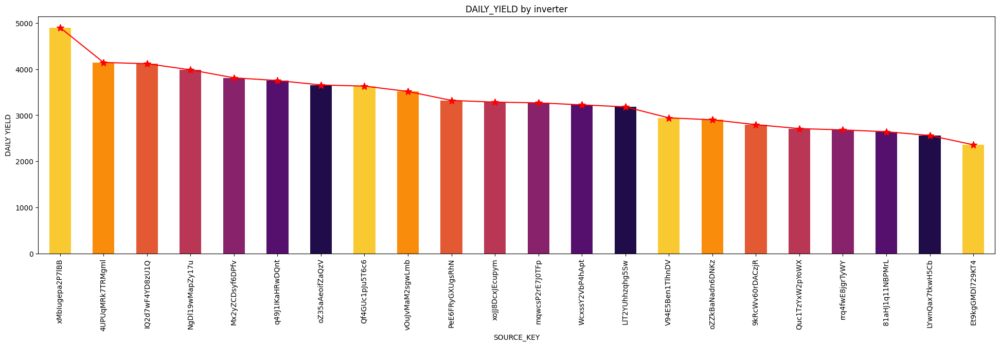

In [66]:
plt.figure(figsize=(24,6))
plt.title('DAILY_YIELD by inverter')
plt.ylabel('DAILY YIELD')
df.groupby('SOURCE_KEY')['DAILY_YIELD'].mean().sort_values(ascending=False).plot(kind='line', marker='*', color='red', ms=10)
df.groupby('SOURCE_KEY')['DAILY_YIELD'].mean().sort_values(ascending=False).plot(kind='bar',color=sns.color_palette("inferno_r", 7))
plt.show()

,DC_POWER,AC_POWER,DAILY_YIELD,TOTAL_YIELD,AMBIENT_TEMPERATURE,MODULE_TEMPERATURE,IRRADIATION
DATE_TIME,,,,,,,
2020-05-15,318.951020,311.692697,3826.512932,6.447034e+08,30.565992,35.559493,0.300622
2020-05-16,268.390076,262.430616,3425.500902,6.377676e+08,29.478612,35.143314,0.246631


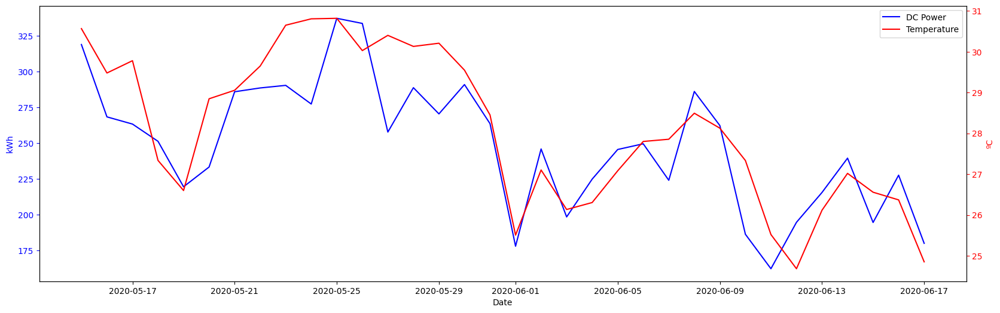

In [67]:
df1 = df.set_index('DATE_TIME')
daily_data = df1.resample('24h').mean()
display(daily_data.head(2))

fig, ax1 = plt.subplots(figsize=(20,6))
ax1.plot(daily_data.index, daily_data['DC_POWER'], 'b', label='DC Power')
ax1.set_xlabel('Date')
ax1.set_ylabel('kWh', color='b')
ax1.tick_params('y', colors='b')

ax2 = ax1.twinx()

ax2.plot(daily_data.index, daily_data['AMBIENT_TEMPERATURE'], 'r', label='Temperature')
ax2.set_ylabel('ºC', color='r')
ax2.tick_params('y', colors='r')

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
lines = lines1 + lines2
labels = labels1 + labels2
ax1.legend(lines, labels, loc='upper right')
plt.show()


In [68]:
import plotly.express as px
import plotly.graph_objs as go

dfpie = df1.groupby('SOURCE_KEY')['DAILY_YIELD'].count()
fig = px.pie(values=dfpie.values, names=dfpie.index, 
            title = 'Proportional Analysis of DAILY_YIELD with SOURCE_KEY')
fig.show()

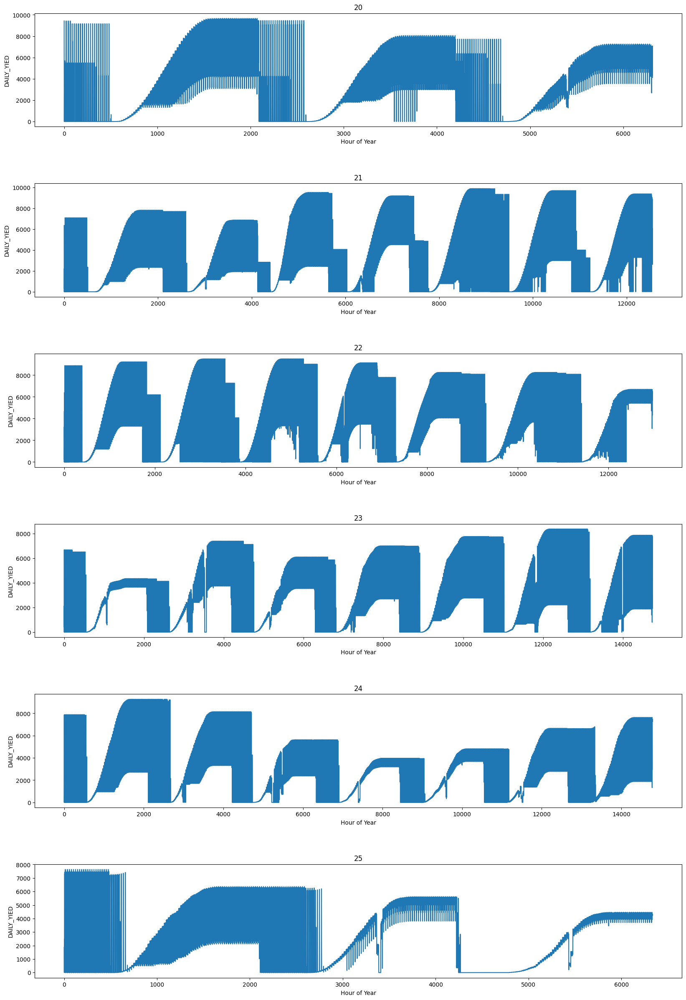

In [69]:
#group data by week
groups = df1['DAILY_YIELD'].groupby(pd.Grouper(freq='W'))

#set figure and axis
fig, axs = plt.subplots(len(groups), 1, figsize=(20,30))
for ax, (name, group) in zip(axs, groups):
    
    #plot the data
    ax.plot(pd.Series(group.values))

    ax.set_xlabel('Hour of Year')
    ax.set_ylabel('DAILY_YIED')
    ax.set_title(name.week)
    plt.subplots_adjust(hspace=0.5)

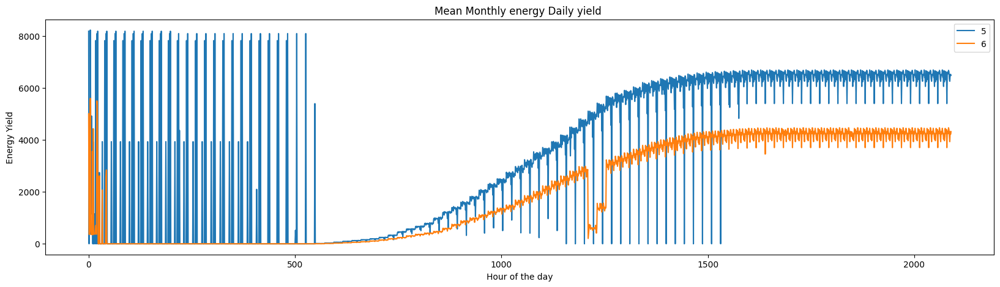

In [70]:
group_hours = df1['DAILY_YIELD'].groupby(pd.Grouper(freq='D', how='mean'))

fig, axs = plt.subplots(1,1, figsize=(20,5))

year_demands = pd.DataFrame()
    
for name, group in group_hours:
    year_demands[name.month] = pd.Series(group.values)
    
year_demands.plot(ax=axs)
axs.set_xlabel('Hour of the day')
axs.set_ylabel('Energy Yield')
axs.set_title('Mean Monthly energy Daily yield ');